### **INFO 2950 Final Project**

By Annika Lafyatis

# Relationships between county demographics and coronavirus outbreaks

The coronavirus pandemic has drastically changed American life as we know it for the time being. The disease has touched every corner of the US, from coast to coast, from the largest urban cities to the smallest rural towns.

In this project, I seek to understand what demographic factors are characteristic of communities that are particularly hard-hit by the virus. I do this by combining data about county cases with economic and demographic data about counties. How this may have long term effects on communities and vulnerable populations remains to be seen. Additionally, understanding regions and demographics that are particularly at risk for the spread of the disease could help inform social distancing policies, and allow us the allocate resources and react to new outbreaks more quickly.

In this report, I show that counties that are more urban and have higher population densities tend to have more coronavirus cases per capita. I examine the speed of the virus spread through the most-infected counties. I also show that counties that the CDC deem as vulnerable due to minority and English-speaking status tend to have more cases per capita.

## Data description

### What are the observations (rows) and the attributes (columns)?
* The main dataset I've imported for this project is called finaldataset.csv, which is represented by the variable fulldata
* Each row of data represents information about a US county on a specific date.
* The columns keep track of information about each county's status related to coronavirus, such as total number of cases, as well as demographic information about the county.
* The demographic county information is static from day to day, so there is a lot of repeated information in the columns, but this still seemed like the easiest way to keep all the information together.
* Here is a list of all the attributes from the dataset and their descriptions:
    
    * **FIPS:** The standardized code for US county names
    * **State:** State name
    * **Area_name** County and state name
    * **Rural_urban_continuum_code:** A classification scheme on a scale of 1-8 that "that distinguishes metropolitan (metro) counties by the population size of their metro area, and nonmetropolitan (nonmetro) counties by degree of urbanization and adjacency to a metro area or areas." (https://seer.cancer.gov/seerstat/variables/countyattribs/ruralurban.html). A 1 is a county in a metro area with a population > 1 million. An 8 is 9 completely rural or less than 2,500 urban population, not adjacent to a metro area.
    * **Urban_influence_code:** A classification scheme of 1-12 that ranks variables by their relationship to metro areas
    * **Metro_2013:** A dummy variable. 1=metro county, 0=non-metro county.
    * **Unemployment_rate_2018:** County unemployment rate
    * **Median_Household_Income_2018:** County median household income
    * **date:** date. Transformed by me into days from 0 (January 21, when the first case of covid was reported in the US) to 105 (May 5).
    * **cases:** # of total cases in a county on that specific date
    * **deaths:**  # of total cases in a county on that specific date
    * **daysafter:** # of days since the first case was reported in the county
    * **AREA_SQMI:** square mileage of a county
    * **E_TOTPOP:** total population of a county
    * **E_PCI:** social vulnerability theme 1
    * **EP_POV:** social vulnerability theme 1
    * **EP_NOHSDP:** social vulnerability theme 1
    * **EP_AGE65:** social vulnerability theme 2
    * **EP_AGE17:** social vulnerability theme 2
    * **EP_DISABL:** social vulnerability theme 2
    * **EP_SNGPNT:** social vulnerability theme 2
    * **EP_MINRTY:** social vulnerability theme 3
    * **EP_LIMENG:** social vulnerability theme 3
    * **EP_MUNIT:** social vulnerability theme 4
    * **EP_MOBILE:** social vulnerability theme 4
    * **EP_CROWD:** social vulnerability theme 4
    * **EP_NOVEH:** social vulnerability theme 4
    * **EP_GROUPQ:** social vulnerability theme 4
    * **RPL_THEME1:** county percentile ranking (0 to 1) for vulnerability based on socioeconomic status
    * **RPL_THEME2:** county percentile ranking (0 to 1) for vulnerability based on household composition and disability
    * **RPL_THEME3:** county percentile ranking (0 to 1) for vulnerability based on minority status and language
    * **RPL_THEME4:** county percentile ranking (0 to 1) for vulnerability based on housing type/transportation 
    * **RPL_THEMES:** overall percentile rankings for vulnerability based on all 4 themes
    * **cases_per_capita:** cases / E_TOTPOP (calculated by me)
    * **cases_per_100k:** cases / E_TOTPOP * 100000 (calculated by me)
    * **density:** E_TOTPOP / AREA_SQMI (calculated by me)
    * **first_day:** the first day covid was reported in the county (calculated by me)
    * **days_since_first:** days since the first reported case in the county (calculated by me)
    * **spread_speed:** cases_per_100k / days_since_first (calculated by me) NOTE: I thought this was going to be a much more interesting variable than it ended up being. It ended up being quite skewed by days_since_first, and seemed to be overrepresenting counties that may not have had widespread testing until quite recently.


### Why was this dataset created?
* This dataset was created to explore how economic and demographic factors may relate to areas that are particularly hard-hit by the virus. It combines three datasets from different sources.
* The coronavirus case data was created by the New York Times for use in their own reporting and data visualizations. 
* The Social Vulnerability Index (SVI) was created to identify and classify vulnerable populations, so that governing agencies could develop emergency-preparedness analysis and plans. It provides county data about population vulnerability based on demographic measurements of a variety of factors. These factors are categorized by "socioeconomic status", "household composition & disability", "minority status & languge", and "housing type and transportation."
* The county economic data was created by the Local Area Unemployment Statistics to measure economic growth and progress. It includes measures such as the rurality of the county, employment rates, median income, and median income relative to the rest of the state.

### Who funded the creation of the dataset?
* Coronavirus data is created and funded by the New York Times.
* SVI data is created and funded by the government, specifically the Center for Disease Control (CDC) and Agency for Toxic Substances and Disease Registry (ATSDR)
* Unemployment data is created and funded by the US Economic Research Service

### What processes might have influenced what data was observed and recorded and what was not?
* The main issue with the coronavirus data is just massive lack of and inconsistencies with testing.
* This has multiple effects: first, it is likely that deaths caused by coronavirus are being undercounted
* Also, it likely is drastically undercounting the number of cases of the disease. I suspect this is even more true in lower income and more rural communities, where testing is lagging the most.
* One metric I also track is the first day of the reported case in the county, which I also use to calculate spread speed. I think lack of testing may heavily influence the accuracy of this value.
* Additionally, sometimes SVI data uses a dummy value of zero if the calculation to estimate it caused a divide by zero error. I believe this mostly occurs when there is incomplete census data for an area, which is probably most frequently in more rural towns with lower incomes and/or less internet access.

### What preprocessing was done, and how did the data come to be in the form that you are using?
* I did almost all my preprocessing in a seperate notebook called preproc.ipynb.
* I imported my three datasets (covid, svi, and unemployment) into the notebook. In doing this, I made sure my FIPS codes were imported as strings (to allow for leading zeros to be preserved).
* I merged the three datasets on the FIPS attribute.
* I also filtered out quite a few columns from the SVI and unemployment data, because these were very large datasets.
* I also added several columns of my own by calculating information from other parts of the set.
* After I finished, I saved the information into a CSV file called 'finaldataset.csv'
* I realized when writing this report that some of my columns were redundant, so I did one more quick processing to filter this out in a notebook called preproc.ipynb. The data set I use in this project is 'finaldataset2.csv'
* I found the processing of the data to be one of the most time consuming aspects of the project. Because the dataset was so large, it was unwieldy to manage at first. Additionally, having to upload/save/modify these large files could be time consuming, especially when I made a mistake. For instance, at one point, I accidentally wrote a 1.5 gigabyte dataframe to a csv file, which took a long time with my not-super-powerful laptop. 
* At 32 megabytes, my final dataset is large but manageable. I filtered a lot of columns out during the preprocessing, and then again when I was polishing up the final report. However, I chose to keep some variables I didn't use for the sake of potential further exploration.

### If people are involved, were they aware of the data collection and if so, what purpose did they expect the data to be used for?
* The SVI and economic data is government data compiled from census information.
* The coronavirus data is also sourced from local/state level press releases. 
* All the information is very depersonalized and shows county-level demographics, so I don't think that it poses any substantial privacy concerns.
* I think people generally expect for the government to collect depersonalized data like the ones shown. People would expect that this type of information might be used in a very broad sense to shape policies or at least inform legislators in their decision-making.
* The New York Times has generously made their collected coronavirus data open-source. I believed they hope that sharing this aggregated data could help other people understand and study the virus outbreak.


### Where can your raw source data be found, if applicable? Provide a link to the raw data (hosted in a Cornell Google Drive or Cornell Box).
* Here is the link to my final, curated dataset: https://cornell.box.com/v/akl65-info2950
* Here is a link to the New York Times covid data: https://github.com/nytimes/covid-19-data/blob/master/us-counties.csv
* Here is a link to the download for the Social Vulnerability Index: https://svi.cdc.gov/data-and-tools-download.html
* Here is a link to the download for the county level employment data: https://www.ers.usda.gov/data-products/county-level-data-sets/download-data/ 
* My entire project, including all these datasets is also available at: https://github.com/Annika18/covid-final-project

## Importing libraries, data, initial exploration

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression, LogisticRegression
import plotly
from numpy import percentile

from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)
    
import plotly.express as px

In [139]:
from scipy.special import comb

In [202]:
from sklearn.cluster import KMeans

In [350]:
fulldata = pd.read_csv('finaldataset2.csv', dtype={'FIPS': str})
fulldata.head()

,FIPS,State,Area_name,Rural_urban_continuum_code_2013,Urban_influence_code_2013,Metro_2013,Unemployment_rate_2018,Median_Household_Income_2018,date,cases,...,RPL_THEME2,RPL_THEME3,RPL_THEME4,RPL_THEMES,cases_per_capita,cases_per_100k,density,first_day,days_since_first,spread_speed
0,01001,AL,"Autauga County, AL",2.0,2.0,1.0,3.6,59338,2020-03-24,1,...,0.581,0.5947,0.3741,0.4354,0.000018,1.811594,92.859967,63.0,0.0,1.000000
1,01001,AL,"Autauga County, AL",2.0,2.0,1.0,3.6,59338,2020-03-25,4,...,0.581,0.5947,0.3741,0.4354,0.000072,7.246377,92.859967,63.0,1.0,7.246377
2,01001,AL,"Autauga County, AL",2.0,2.0,1.0,3.6,59338,2020-03-26,6,...,0.581,0.5947,0.3741,0.4354,0.000109,10.869565,92.859967,63.0,2.0,5.434783
3,01001,AL,"Autauga County, AL",2.0,2.0,1.0,3.6,59338,2020-03-27,6,...,0.581,0.5947,0.3741,0.4354,0.000109,10.869565,92.859967,63.0,3.0,3.623188
4,01001,AL,"Autauga County, AL",2.0,2.0,1.0,3.6,59338,2020-03-28,6,...,0.581,0.5947,0.3741,0.4354,0.000109,10.869565,92.859967,63.0,4.0,2.717391


A quirk worth noting about this data: unfortunately, the New York Times data combines the five boroughs (counties) that make up New York City into row to represent the whole city. For this reason, there was no valid way to merge it with the county level data -- it didn't have a FIPs code and it would be too time-consuming for the scope of this project to try to combine the borough data from the other data sets using some sort of weighted average system. 

Instead, I created an extra dataset called nyc of just the covid cases in New York City, to be used for comparisons.

In [3]:
covid = pd.read_csv('covid2.csv')
covid.rename(columns={'fips':'FIPS'}, inplace=True)

covid['date'] = pd.to_datetime(covid["date"])
start_date = pd.Timestamp("2020-01-21")
covid["daysafter"] = (covid["date"] - start_date).dt.days

nyc = covid[covid['county']=='New York City']
nyc = nyc.assign(cases_per_capita = nyc['cases']/8398748)
nyc.head()

,date,county,state,FIPS,cases,deaths,daysafter,cases_per_capita
416,2020-03-01,New York City,New York,NaN,1,0,40,1.190654e-07
448,2020-03-02,New York City,New York,NaN,1,0,41,1.190654e-07
482,2020-03-03,New York City,New York,NaN,2,0,42,2.381307e-07
518,2020-03-04,New York City,New York,NaN,2,0,43,2.381307e-07
565,2020-03-05,New York City,New York,NaN,4,0,44,4.762615e-07


If we are not mapping the change in COVID over time, it will be easiest to look at the data just using the most recent day. I create the latest_date dataframe for this. This data is current as of May 5, because it was going to be impractical for me to continue downloading and reprocessing the New York Times data every day.

In [196]:
latest_date = fulldata[fulldata['date']=='2020-05-05']

print('Number of counties with cases as of May 5: ', len(latest_date))

Number of counties with cases as of May 5:  2859


In [333]:
# prints a five number summary of a series
def five_num_summary(series):
    mini = series.min()
    maxi = series.max()
    quart1 = percentile(series, 25) 
    med = series.median()
    quart3 = percentile(series, 75) 

    print('min:    ', mini)
    print('Q1:     ', quart1)
    print('median: ', med)
    print('Q3:     ', quart3)
    print('max:    ', maxi)

In [89]:
print('Five number summary of cases')
five_num_summary(latest_date['cases'])

Five number summary of cases
min:     1
Q1:      7.0
median:  26.0
Q3:      113.0
max:     45223


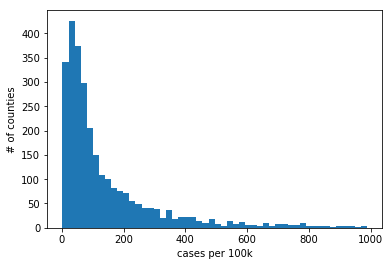

In [131]:
case_hist = latest_date[ latest_date['cases_per_100k'] < 1000 ]

plt.hist(case_hist['cases_per_100k'], bins=50)
plt.xlabel('cases per 100k')
plt.ylabel('# of counties')
plt.show()

## Predicting death rate

One statistic about the coronavirus that seems simple but is deceptively tricky to measure is its death rate. For instance, in Italy, the death rate appeared to be around 13% in April. However, calculating a crude death rate (simply dividing total deaths by total cases) may not be a sufficient measurement. Here we'll plot the cases vs deaths by county, and come up with a regression line to estimate a death rate.

In [284]:
# takes a data frame df and 2 string column names x and y
# calculates and plots a linear regression of the data 
def lin_regress(df, x, y):
    model = LinearRegression(fit_intercept=True)
    model.fit(df[[x]], df[y])
    
    xfit = np.linspace(0, df[x].max(),1000)
    yfit = model.predict(xfit[:,np.newaxis])
    
    #plt.figure(figsize=(5,5))
    plt.plot(xfit,yfit, color='red')
    plt.scatter(df[x], df[y], alpha=.1)

    plt.xlabel(x)
    plt.ylabel(y)
    plt.show()
    
    print("Model slope:     ", model.coef_[0])
    print("Model intercept: ", model.intercept_)
    print("Model r-squared: ", model.score(df[[x]], df[y]))
    print("Correlation (r): ", np.corrcoef(df[x], df[y])[0][1])

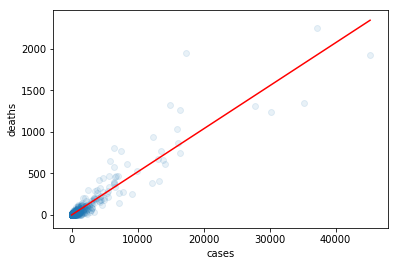

Model slope:      0.05177516908439397
Model intercept:  -0.29041299443852964
Model r-squared:  0.8825339800769234
Correlation (r):  0.9394327969987655


In [285]:
lin_regress(latest_date, 'cases', 'deaths')

This model shows that, as we would expect, there is a strong correlation of .93 between the number of coronavirus cases in a county, and the number of deaths in that county. As the r-squared value tells us, about 88% of the variance in number of deaths can be explained by the number of cases.

The slope of the model is .05. This means for every 1 new case in a county, there will be a .05 increase in deaths in the county. Put in a more intuitive way, for every 20 cases in a county there will be 1 death.

## What types of counties have the most cases?

In this next section, we will examine what counties are most affected by the virus, and see if there are any noteworthy or unexpected attributes that seem to correlate to cases per capita.

First, let's take a look at the counties with the most cases per 100k citizens. I'm using the cases per 100k statistic rather than per capita because I find it easier to visualize, but they convey the same thing.

In [102]:
print('Five number summary of cases per 100k')
five_num_summary(latest_date['cases_per_100k'])
print('\nmean: ', latest_date['cases_per_100k'].mean())

Five number summary of cases per 100k
min:     1.5779590677417827
Q1:      38.69707097880246
median:  79.66493994422446
Q3:      193.65348247258845
max:     14123.054423900552

mean:  195.05710796317751


In [80]:
fig = px.choropleth_mapbox(latest_date, geojson=counties, locations='FIPS', color='cases_per_100k',
                           color_continuous_scale="viridis",
                           range_color=(0, 500),
                           mapbox_style="carto-positron",
                           zoom=3, center = {"lat": 37.0902, "lon": -95.7129},
                           opacity=0.5                           
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Here's what the infection rates around the country look like. Some counties are missing, but in general, this gives a pretty good idea of where the hotspots are: New England, certain southern states, some metro midwest areas, and even some swaths of the west. The virus certainly seems to be quite widespread at this point in time.

I'm interested in how characteristics of counties may relate to the infection rate of the coronavirus. The first thing we'll look at is the rural-urban continuum scale, a scheme that distinguishes metro areas (1-3 on the scale) and non-metro areas by their population and how close they are to large metro areas.

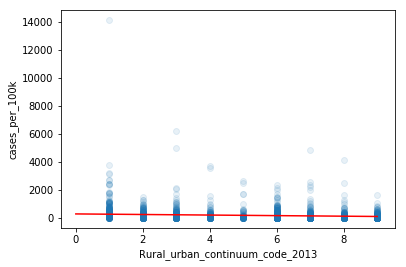

Model slope:      -20.25868418751227
Model intercept:  290.8041828452069
Model r-squared:  0.013650069440119816
Correlation (r):  -0.11683351163137932


In [64]:
lin_regress(latest_date, 'Rural_urban_continuum_code_2013', 'cases_per_100k')

The correlation between rural-urban-continuum and cases per 100k looks quite weak. The slope is -20, meaning for each increase on the continuum (where higher numbers are MORE rural), you would expect a county to have 20 fewer cases per 100k residents. 

Let's do a permutation test to see if this is a significant result.

In [65]:
# returns a permuted copy of a series
def permuted_y(series):
    return np.random.permutation(series.copy())

In [167]:
# takes 2 data lists of the same length = x and y, a number of times to be run  = num, and a slope for comparison
# purposes = slope
# creates num linear regressions of x and a randomly permuted version of y, and stores their slopes
# plots a histogram of the stored slopes and prints how many of these slopes are greater than your comparison
# slope
def perm_test(x, y, num, slope):
    simul = np.zeros(num)
    for i in range(num):
        model = LinearRegression().fit(x, permuted_y(y))
        simul[i] = model.coef_[0]
        
    plt.hist(simul, bins=30)
    plt.show()
    
    if slope > 0:
        print('slope count out of ', num, ' permuted samples:        ', np.count_nonzero(simul > slope))
        
    else:
        print('count out of ',num, ' permuted samples:               ', np.count_nonzero(simul < slope))

In [349]:
# takes 2 data lists of the same length = x and y, a number of times to be run  = num, and a correlation for 
# comparison purposes = corr
# creates num correlation coefficients of x and a randomly permuted version of y, and stores this correlation
# prints how many of these correlations are greater than your comparison correlation
def corr_test(x, y, num, corr):
    correl = np.zeros(num)
    for i in range(num):
        correl[i] = np.corrcoef(x,permuted_y(y))[0][1]
    
    if corr > 0:
        print('correlation count out of ', num, ' permuted samples:  ', np.count_nonzero(correl > corr))
    else:
        print('correlation count out of ', num, ' permuted samples:  ', np.count_nonzero(correl < corr))

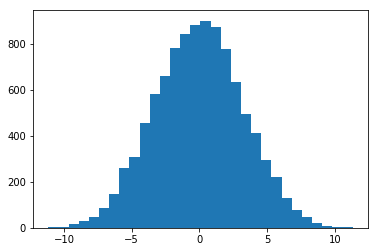

count out of  10000  permuted samples:                0


In [174]:
perm_test(latest_date[['Rural_urban_continuum_code_2013']], latest_date['cases_per_100k'], 10000, -20)

In [185]:
corr_test(latest_date['Rural_urban_continuum_code_2013'], latest_date['cases_per_100k'], 10000, -.116)

correlation count out of  10000  permuted samples:   0


Out of 10,000 permuted samples of this data, none had a slope of less than -20, and none of them had a correlation stronger than -.116. In fact, it looks like none of the slopes were smaller than -10. Essentially, we can be quite confident that there is a relationship between urbanness of a county and the infection rate per 100k residents.

But to be sure, let's think of this idea in another way. The urban-rural continuum assigns labels to counties based on the county's population and closeness to a metro area. Another way to think of urbanness is a simple measure of population density. Let's see if comparing population density and cases per 100k corroborates our findings about the urban-rural continuum.

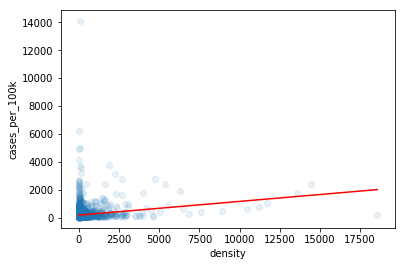

Model slope:      0.09862137008026778
Model intercept:  171.84984145443613
Model r-squared:  0.033146896551727756
Correlation (r):  0.1820628917482298


In [92]:
lin_regress(latest_date, 'density', 'cases_per_100k')

Comparing density and cases per 100k actually yields a higher correlation than rural-urban continuum and cases per 100k. It's still quite a low correlation, but for such a large dataset, getting a really strong correlation is quite difficult. 

Understanding the slope of this graph is a bit abstract, so I thought I'd describe it here: for every 1 additional person per square mile in a county, you might expect the number of cases per 100k of that population to increase by .09. Put more plainly: for every 10 additional people per square mile, the cases per 100k of that county increases by one. We'll do a permutation test to see how significant of a result this is.

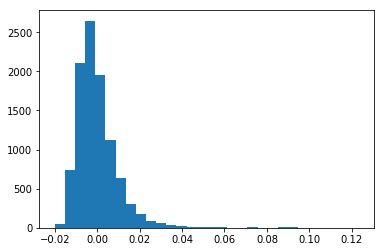

count out of  10000  permuted samples:   4


In [137]:
perm_test(latest_date[['density']], latest_date['cases_per_100k'], 10000, .098)

In [186]:
corr_test(latest_date['density'], latest_date['cases_per_100k'], 10000, .18)

correlation count out of  10000  permuted samples:   5


Only 4 out of 10,000 permutations of the data had a slope greater than the slope from our actual data, and 5 had a greater correlation. This is a strong signal that there is, once again, a significant (but weak) relationship between population density and infection rate in a population.

## Case spread

Another way to think about the outbreak is how fast the virus spreads within a county. Here we'll take a look at the counties with the highest cases per capita, and see how the virus has spread within the county.

In [365]:
latest_date.sort_values(by='cases_per_capita', ascending=False).filter(items=['FIPS', 'Area_name', 
    'Rural_urban_continuum_code_2013', 'E_TOTPOP', 'cases', 'cases_per_capita', 'first_day', 
    'spread_speed', 'RPL_THEMES']).head()

,FIPS,Area_name,Rural_urban_continuum_code_2013,E_TOTPOP,cases,cases_per_capita,first_day,spread_speed,RPL_THEMES
94585,47169,"Trousdale County, TN",1.0,9573,1352,0.141231,67.0,371.659327,0.5220
5763,05079,"Lincoln County, AR",3.0,13695,853,0.062286,55.0,124.571011,0.8134
63476,31043,"Dakota County, NE",3.0,20317,1014,0.049909,82.0,216.995405,0.8615
53275,27105,"Nobles County, MN",7.0,21839,1069,0.048949,80.0,195.796511,0.8150
91251,47007,"Bledsoe County, TN",8.0,14602,601,0.041159,67.0,108.312488,0.8159


New York City is often viewed as the epicenter of the virus, so we'll being comparing the top 3 most infected counties to NYC.

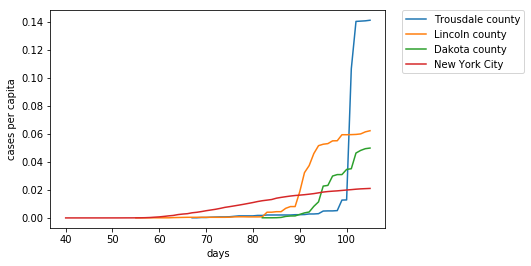

In [364]:
trousdale_county = fulldata[ fulldata['FIPS'] == '47169']
dakota_county = fulldata[ fulldata['FIPS'] == '31043']
lincoln_county = fulldata[ fulldata['FIPS'] == '05079']

plt.plot(trousdale_county['daysafter'], trousdale_county['cases_per_capita'], label='Trousdale county')
plt.plot(lincoln_county['daysafter'], lincoln_county['cases_per_capita'], label='Lincoln county')
plt.plot(dakota_county['daysafter'], dakota_county['cases_per_capita'], label='Dakota county')

plt.plot(nyc['daysafter'], nyc['cases_per_capita'], label = 'New York City')

plt.xlabel('days')
plt.ylabel('cases per capita')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.show()

Not only do these counties have significantly higher infection rates than NYC, but they also appeared to have a later start to their outbreak, with a very rapid increase in cases per capita.

While New York City's increase in cases per capita is "slow and steady" and even looks to be somewhat levelling out, these other counties have a much more dramatic increase in their infection rate. This may be the result of late detection: if testing isn't widespread, then people will likely continue to transmit the disease without realizing it until and the damage is already done. Additionally, it may make the increase in cases per capita look more dramatic than the true values if it's not until quite late in the virus spread that testing is implemented.

This underscores the importance of testing and social distancing. If serious precautions are not taken, the virus can become widespread in a county very quickly.

## Other factors that may relate to infection rate

So far, we have looked at the relationship between urbanness and density of counties, and concluded that they both are related to the cases per capita in a population. But what other factors may be correlated with a county's infection rate? To begin to investigate, we will run a for-loop calculating the correlation of cases per capita to all the other numerical attributes of the dataframe.

It's important to note that just "brute force" testing is a perilous strategy for finding meaningful relationships between variables. That's why we will be using permutation testing on any results that do seem significant to analyze their validity.

In [198]:
for col in latest_date:
    if not isinstance(latest_date[col].values[0], str) and col != 'date' and col !='daysafter':
        print(col, ':   ', np.corrcoef(latest_date[col], latest_date['cases_per_capita'])[0][1])

Rural_urban_continuum_code_2013 :    -0.11686556023988795
Urban_influence_code_2013 :    -0.111119420850413
Metro_2013 :    0.10127533408005275
Civilian_labor_force_2018 :    0.09431427201593418
Employed_2018 :    0.09440068235741515
Unemployed_2018 :    0.09039071177711475
Unemployment_rate_2018 :    -0.004011347225654298
Median_Household_Income_2018 :    0.08271130990347679
Med_HH_Income_Percent_of_State_Total_2018 :    0.05205588116855824
cases :    0.34544928038980777
deaths :    0.30951755353416915
ST :    -0.056261624012769997
AREA_SQMI :    -0.03273860854970434
E_TOTPOP :    0.09321300314509945
E_PCI :    0.05295538575275677
EP_POV :    0.032735951156988456
EP_NOHSDP :    0.10491938411688984
EP_AGE65 :    -0.14021851750799783
EP_AGE17 :    0.04138309923698829
EP_DISABL :    -0.1015610729185387
EP_SNGPNT :    0.12103865276818669
EP_MINRTY :    0.18520385638397127
EP_LIMENG :    0.17922840198809936
EP_MUNIT :    0.11290810209364484
EP_MOBILE :    -0.025038891965960017
EP_CROWD :  

The correlations look pretty low for most of these variables; but so far, we have found that even results with correlations of around 0.1 have proven to be unlikely to occur randomly, because our data set is so large. We don't have time to investigate all these results, but we'll look at some. 

One interesting aspect of the SVI data are its the RPL_Themes. This is one of the ways that vulnerability is measured. The measurements of the SVI data (such as EP_AGE65), are assigned to 1 of 4 themes, each a different type of social disadvantage. The RPL represents a percentile score for each county for each vulnerability theme. The closer a county's rank is to 1, the more "vulnerable" it is.

The theme ranking variables are:
 - RPL_THEME1: Socioeconomic
 - RPL_THEME2: Household Composition & Disability
 - RPL_THEME3: Minority Status & Language
 - RPL_THEME4: Housing Type & Transportation
 - RPL_THEMES: Composite of all themes

In [199]:
five_num_summary(latest_date['RPL_THEMES'])

min:     0.0
Q1:      0.26785000000000003
median:  0.5143
Q3:      0.75905
max:     1.0


To be able to run a clustering algorithm of interest, the variables we are clustering should be relatively close in scale. Thus, I added a column to latest date of the percentile of cases per capita. Now this data is also scaled from 0 to 1.

In [324]:
latest_date['Percentile_cases_per_cap']=latest_date.cases_per_capita.rank(pct=True)

five_num_summary(latest_date['Percentile_cases_per_cap'])

min:     0.0003497726477789437
Q1:      0.2502623294858342
median:  0.5001748863238895
Q3:      0.7500874431619446
max:     1.0


The correlation tests we ran on all the non-string data indicated there might be a significant relationship between RPL_THEME3 (Minority status and language) and cases per capita. We will perform a linear regression on this ranked data and also attempt to cluster the data into meaningful groups.

In [343]:
# takes a dataframe = df, two string column names from the dataframe = x and y, and a desired number of 
# clusters = clus
# plots a linear regression and clustering of the data
def cluster_and_regress(df, x, y, clus):
    model = LinearRegression(fit_intercept=True)
    model.fit(df[[x]], df[y])

    xfit = np.linspace(0, df[x].max(),1000)
    yfit = model.predict(xfit[:,np.newaxis])

    arr = np.stack((df[x], df[y]), axis=-1)

    kmeans = KMeans(n_clusters=clus)
    kmeans.fit(arr)

    plt.figure(figsize=(6,6))
    plt.plot(xfit,yfit, color='red')
    plt.scatter(arr[:,0],arr[:,1], c=kmeans.labels_, cmap='viridis', alpha=.2)
    plt.scatter(kmeans.cluster_centers_[:,0] ,kmeans.cluster_centers_[:,1], color='black')
    
    plt.xlabel(x)
    plt.ylabel(y)
    plt.show()
    
    print("Model slope:     ", model.coef_[0])
    print("Model intercept: ", model.intercept_)
    print("Model r-squared: ", model.score(df[[x]], df[y]))
    print("Correlation (r): ", np.corrcoef(df[x], df[y])[0][1])

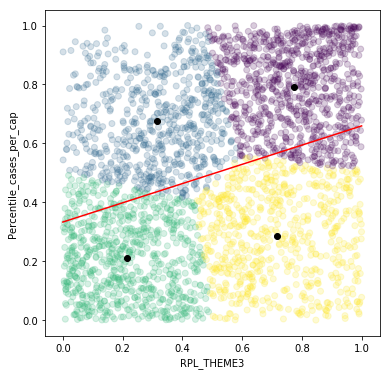

Model slope:      0.3262627767306959
Model intercept:  0.33313523735260864
Model r-squared:  0.10278797173565435
Correlation (r):  0.320605632726024


In [344]:
cluster_and_regress(latest_date, 'RPL_THEME3', 'Percentile_cases_per_cap', 4)

This is a bit of a scary looking visualization at first. It looks like almost the entire grid is covered in points. However, there does seem to be a trend to the data. The top right corner (and bottom left corner, to a lesser extent) look more densely concentrated. The upper left corner is much sparser than the rest of the graph. And the correlation we get between theme 3 rankings and the percentiles for cases per capita is .32, which is actually the strongest correlation we have seen so far. The permutation testing confirms that both the correlation and the slope would be extremely rare results to achieve randomly. 

Using a k-means clustering of 4 clusters, the data shows 4 distinct "quadrants" -- (low, low), (low, high), (high, low), and (high, high). Dividing the data along these lines could help governments come up with specific action plans and identify the most at-risk areas based on which cluster the county falls under. 

For instance, the government should likely be devoting the most resources to communities in the (high, high) quadrant. Since these have large minority/limited-English-speaking populations, the government can emphasize providing information about the virus in multiple languages, and possibly station multi-lingual healthcare workers in these regions. Counties in the (high theme 3, low cases) category should make sure they are providing information about social distancing/health precuations in multiple languages to try to prevent a larger outbreak. Counties in the (low theme 3, high cases) quadrant and the (low, low) quadrant should still receive appropriate resources and health information, although it can be acknowledged that these communities probably have fewer communication barriers break through.

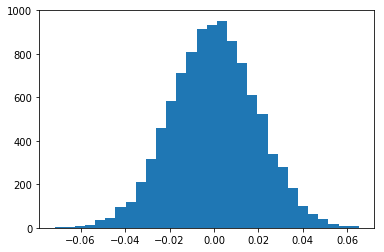

slope count out of  10000  permuted samples:         0
correlation count out of  10000  permuted samples:   0


In [346]:
perm_test(latest_date[['RPL_THEME3']], latest_date['Percentile_cases_per_cap'], 10000, .32)

corr_test(latest_date['RPL_THEME3'], latest_date['Percentile_cases_per_cap'], 10000, .32)

Interestingly, not all of the vulnerability "themes" have any appreciable relationship to cases per capita. For instance, here is a regression and clustering of the case per capita percentile with theme 1, which relates to socioeconomic disadvantage (such as average income and unemployment rates in a county).

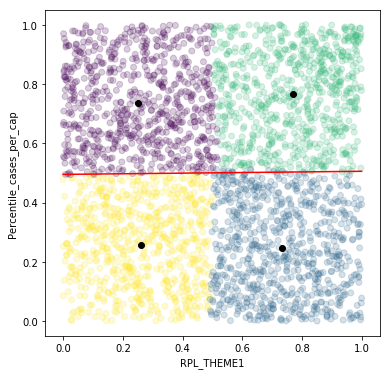

Model slope:      0.010438885855453535
Model intercept:  0.4948700738298156
Model r-squared:  0.00010714969576552935
Correlation (r):  0.010351313721719992


In [347]:
cluster_and_regress(latest_date, 'RPL_THEME1', 'Percentile_cases_per_cap', 4)

In this case, the slope is practically a flat line and indeed, the correlation is a measly 1%. Indeed, in the permutation tests of slope and correlation, we see that about 30% of the permutations slopes and correlations pass this threshold. In other words, this relationship could happen quite often by chance, and likely there is no meaningful connection between these factors.

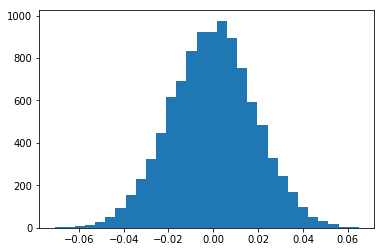

slope count out of  10000  permuted samples:         2899
correlation count out of  10000  permuted samples:   2963


In [332]:
perm_test(latest_date[['RPL_THEME1']], latest_date['Percentile_cases_per_cap'], 10000, .01)

corr_test(latest_date['RPL_THEME1'], latest_date['Percentile_cases_per_cap'], 10000, .01)

It definitely appears that there is a relationship in cases per capita and social vulnerability related to minority status. It's worth noting that there is a relationship between the SVI theme 3 and type of county one lives in. Counties that are more metro rank higher on average for theme 3 than more rural counties. This relationship is shown in the following regression:

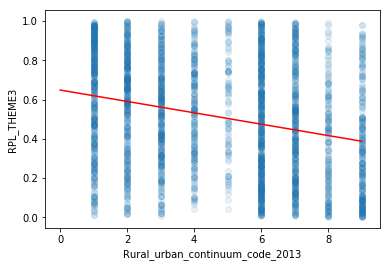

Model slope:      -0.028948214580071147
Model intercept:  0.6488019669886328
Model r-squared:  0.07127746654319833
Correlation (r):  -0.2669784008926534


In [348]:
lin_regress(latest_date, 'Rural_urban_continuum_code_2013', 'RPL_THEME3')

However, I don't think this relationship entirely invalidates either factor's relationship to cases per capita. If I wanted to try to minimize the influence of urban-ness on the SVI theme 3, I might sample a set of counties from each category on the continuum scale and run the regression test again, and see if the correlation remained.

## Conclusions

I have several takeaways after comparing coronavirus county data to other demographic and economic county data.  Qualitatively, I saw that some of the counties with the highest cases per capita have had fairly late-onset outbreaks, which made me curious about the availability of testing in these areas, something I unfortunately did not have data about. Earlier in my data exploration phase of the project, I created a variable called spread_speed that I attempted to use to find trends with outbreak speed and other factors. However, I found my spread_speed variable to be biased towards more recent outbreaks than ones that happened months ago but potentially just as quickly. It ended up not proving very useful in my studies, and mostly just seemed to weakly mirror my findings related to cases_per_capita. I wish I could have been able to look at more time-based trends with the disease though.

However, I did find several interesting results that I was proud of. I found a significant positive relationship between cases per capita of coronavirus and population density. I found a significant negative relationship between cases per capita and score on the rural-urban continuum. I found a significant positive relationship between ranked cases per capita and SVI Theme 3, relating to minority status and English-speaking proficiency. There is a correlation between Theme 3 and the rural-urban continuum, and I was not able to run a test to try to account for this relationship, which may have been valuable for more detailed analysis. 

In light of my research questions, I still find these relationships to be helpful, despite possible confounding effects. I believe knowing the Theme 3 status of a county can guide public health initiatives during the outbreak. I explained a policy strategy for the different clusters of theme 3 -- cases per capita relationships. 

Additionally, understanding that density and urbanness do correlate to cases per capita underscores the importance of social distancing. Policymakers need to acknowledge the difficulty of containing outbreaks in densely populated areas, and factor this into their reopening and social distancing strategies. 

Overall, I found this project very rewarding and interesting. I think the Social Vulnerability Index is a smart, data-driven way for politicians to understand the special needs that communities may have during the coronavirus pandemic. 

## Source Code

Once again, this entire project is hosted at: https://github.com/Annika18/covid-final-project

## Acknowledgements

Thank you to The New York Times, the CDC, and the USDA Economic Research Service for collecting and publishing the data I used in this project for open access.

Thank you to Professor Mimno and all the course staff who have been so helpful and accommodating  all semester, especially during the transition to virtual instruction. This class has taught me a lot.

Thank you to my mom, who called my chloropleth county graph "really cool" when I showed it to her.

Thank you to many Stack Overflow users who helped me figure out and fix my bugs.